In [5]:
with open('/Users/apricot/documents/github/cjc2016/data/apricot_gov_reports1954-2016.txt', 'r') as f:
    reports = f.readlines()

In [6]:
len(reports)

47

In [8]:
print reports[30][:1000]

2000	2000年政府工作报告——2000年3月5日在第九届全国人民代表大会第三次会议上　　　　　　　　　　　　　　　　　  国务院总理朱镕基 　　 各位代表：　　现在，我代表国务院向大会作政府工作报告，请予审议，并请全国政协各位委员提出意见。　　一、1999年国内工作回顾　　1999年，全国各族人民在中国共产党领导下，奋发图强，努力推进改革开放和现代化建设事业，各方面工作都取得了新的成绩。　　国民经济发展质量提高。国内生产总值增长率达到预期目标，经济结构有所调整，经济效益明显改善。农业生产获得好收成，种植结构开始进行调整。工业生产在结构调整中持续增长，淘汰了一批落后生产能力，减少了市场滞销产品的生产，产品销售率稳定上升。全年工业企业实现利润2202亿元，比上年增长52％；其中国有和国有控股工业企业


In [10]:
%matplotlib inline
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import sys
import numpy as np
from collections import defaultdict
import statsmodels.api as sm
from wordcloud import WordCloud
import jieba 
import matplotlib
matplotlib.rcParams['font.sans-serif'] = ['Microsoft YaHei'] #指定默认字体 
matplotlib.rc("savefig", dpi=400)

#  运用jieba练习分词

In [47]:
import jieba

seg_list=jieba.cut("我是爱学习的洋帆同学",cut_all= True)
print("Full Mode: "+"/".join(seg_list))

seg_list=jieba.cut("我是爱学习的洋帆同学",cut_all= False)
print("Default Mode: "+"/".join(seg_list))

seg_list=jieba.cut("我是爱学习的洋帆同学,的同桌")
print(", ".join(seg_list))#默认精确模式

seg_list=jieba.cut_for_search("我是爱学习的洋帆同学")
print(", ".join(seg_list))

Full Mode: 我/是/爱/学习/的/洋/帆/同学
Default Mode: 我/是/爱/学习/的/洋帆/同学
我, 是, 爱, 学习, 的, 洋帆, 同学, ,, 的, 同桌
我, 是, 爱, 学习, 的, 洋帆, 同学


# 停用词

In [17]:
filename = '/Users/apricot/documents/github/cjc2016/data/stopwords.txt'
stopwords={}
f=open(filename,'r')
line=f.readline().rstrip()
while line:
    stopwords.setdefault(line,0)
    stopwords[line.decode('utf-8')]=1
    line=f.readline().rstrip()
f.close()

In [48]:
dir(stopwords)

['__class__',
 '__cmp__',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'clear',
 'copy',
 'fromkeys',
 'get',
 'has_key',
 'items',
 'iteritems',
 'iterkeys',
 'itervalues',
 'keys',
 'pop',
 'popitem',
 'setdefault',
 'update',
 'values',
 'viewitems',
 'viewkeys',
 'viewvalues']

In [18]:
adding_stopwords = [u'我们', u'要', u'地', u'有', u'这', u'人',
                    u'发展',u'建设',u'加强',u'继续',u'对',u'等',u'推进',u'工作',u'增加']
for s in adding_stopwords: stopwords[s]=10

# 关键词（TF-IDF）

In [38]:
import jieba.analyse
txt=reports[0]
tf=jieba.analyse.extract_tags(txt,topK=70,withWeight=True) 

In [39]:
print u",".join([i[0] for i in tf[:35]])

人民,我们,国家,我国,一九五三年,工业,一九五四年,必须,工作,建设,发展,和平,一九四九年,社会主义,一九五,国家机关,生产,计划,全国,农业,亚洲,美国,事业,企业,应当,经济,这些,改造,增加,并且,完成,但是,已经,等于,合作社


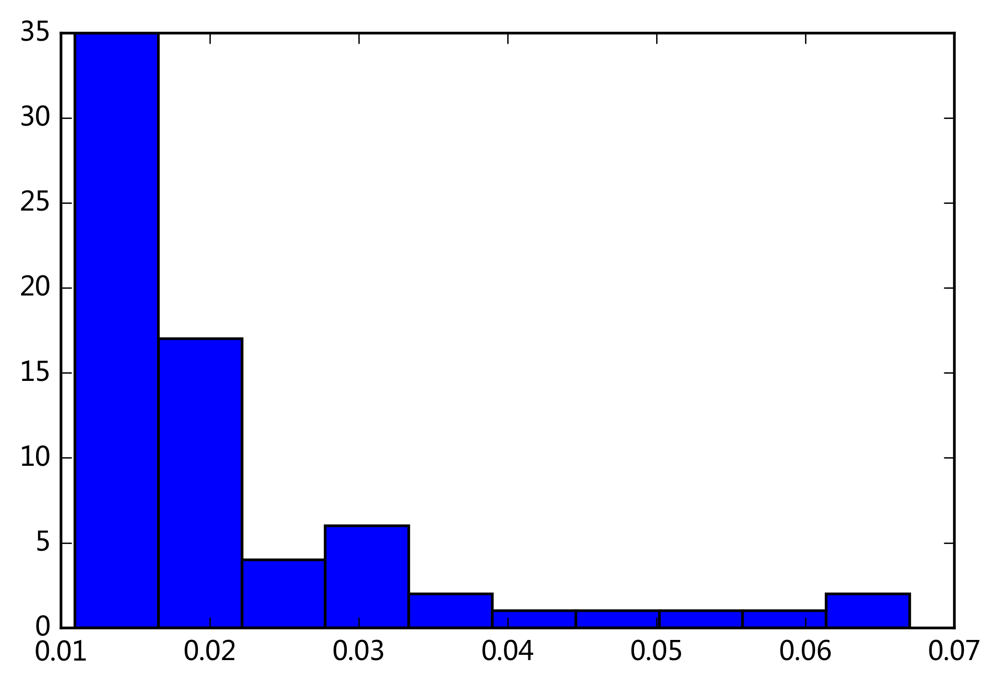

In [40]:
plt.hist([i[1] for i in tf])
plt.show()

# 基于TextRank算法的关键词抽取

In [45]:
tr=jieba.analyse.textrank(txt,topK=70,withWeight=True)
print u",".join([i[0] for i in tr[:35]])

国家,人民,工业,发展,建设,工作,生产,美国,企业,经济,计划,社会主义,中国,进行,全国,技术,亚洲,集团,需要,问题,农业,方面,完成,建立,台湾,生活,事业,没有,改造,应当,资本主义,增加,关系,组织,保证


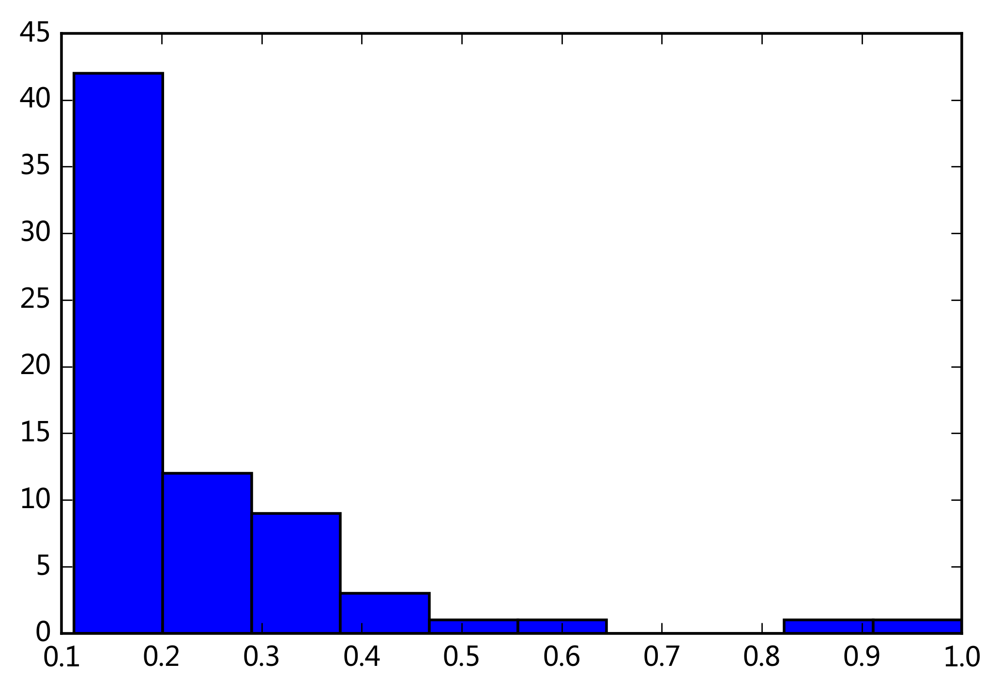

In [46]:
plt.hist([i[1] for i in tr])
plt.show()

In [52]:
import pandas as pd

def keywords(index):
    txt = reports[index]
    tf = jieba.analyse.extract_tags(txt, topK=200, withWeight=True)
    tr = jieba.analyse.textrank(txt,topK=200, withWeight=True)
    tfdata = pd.DataFrame(tf, columns=['word', 'tfidf'])
    trdata = pd.DataFrame(tr, columns=['word', 'textrank'])
    worddata = pd.merge(tfdata, trdata, on='word')
    plt.plot(worddata.tfidf, worddata.textrank, linestyle='',marker='.')
    for i in range(len(worddata.word)):
        plt.text(worddata.tfidf[i], worddata.textrank[i], worddata.word[i], 
                 fontsize = worddata.textrank[i]*15, color = 'blue', rotation = 0)
    plt.title(txt[:4])
    plt.xlabel('Tf-Idf')
    plt.ylabel('TextRank')
    plt.show()

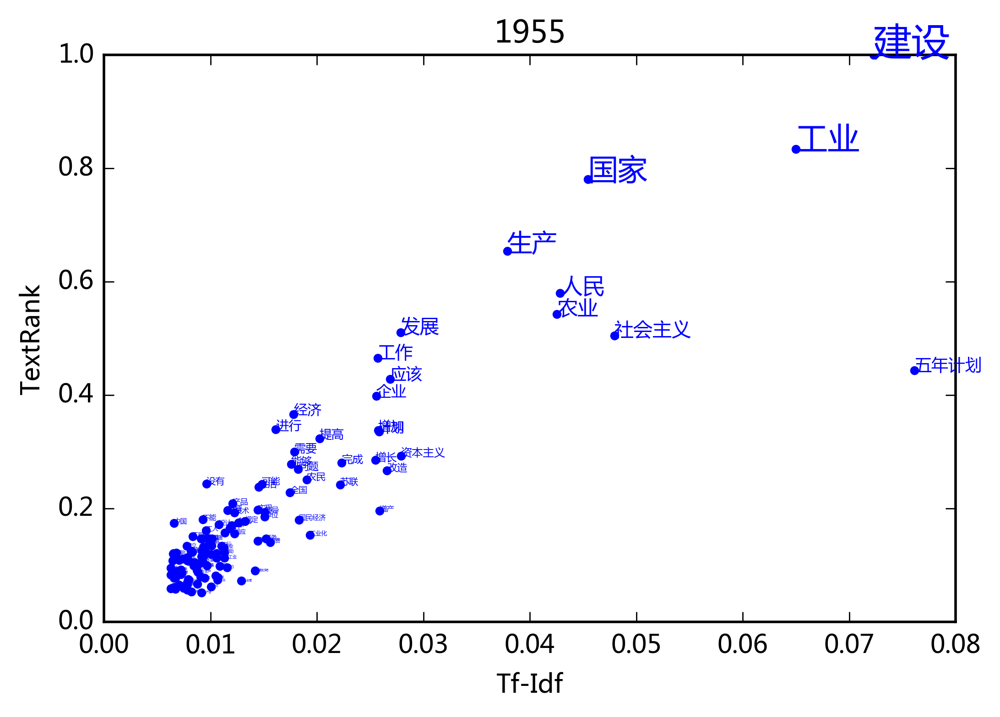

In [53]:
keywords(1)

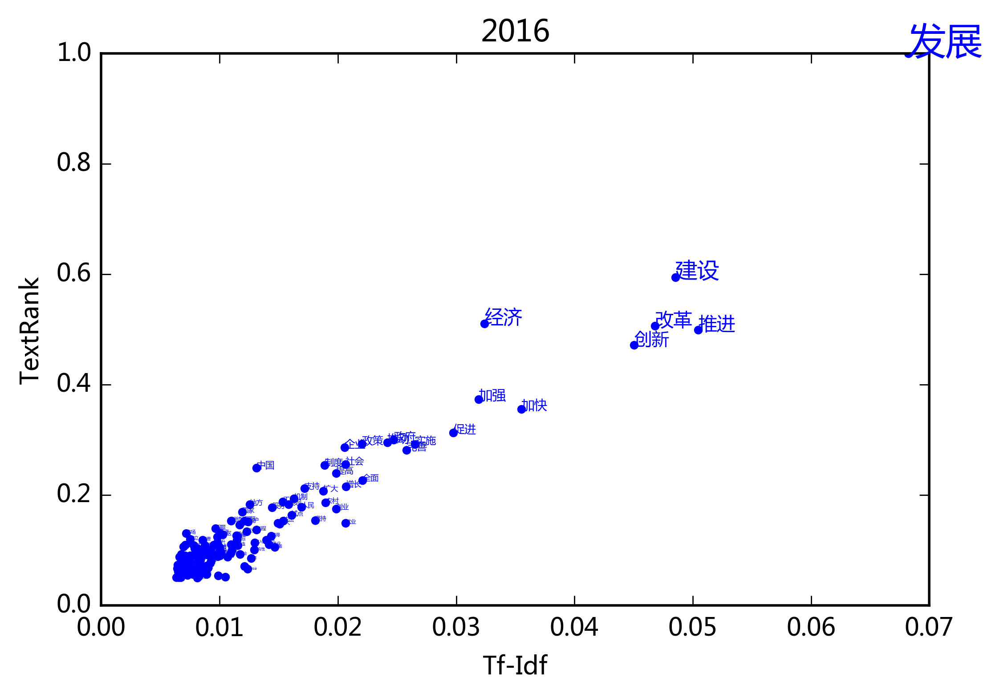

In [54]:
keywords(-1)

# wordcloud

In [55]:
def wordcloudplot(txt, year):
    wordcloud = WordCloud(font_path='/Users/apricot/documents/github/cjc2016/data/msyh.ttf').generate(txt)
    # Open a plot of the generated image.
    plt.imshow(wordcloud)
    plt.title(year)
    plt.axis("off")
    #plt.show()

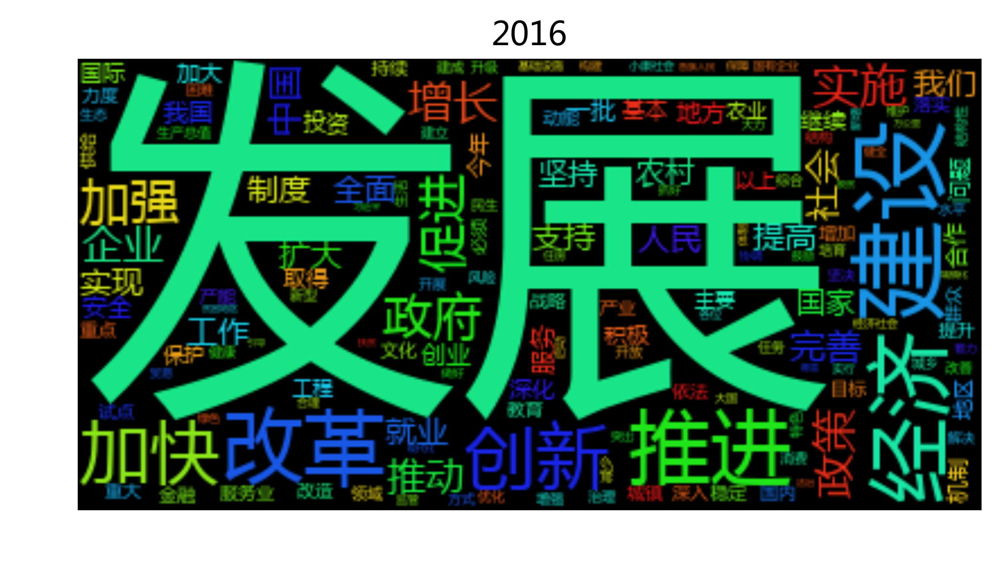

In [67]:
txt = reports[-1]
tfidf200= jieba.analyse.extract_tags(txt, topK=150, withWeight=False)
seg_list = jieba.cut(txt, cut_all=False)
seg_list = [i for i in seg_list if i in tfidf200]
txt10 = r' '.join(seg_list)
wordcloudplot(txt10, txt[:4]) 

In [68]:
wordfreq = defaultdict(int)
for i in seg_list:
    wordfreq[i] +=1
wordfreq = [[i, wordfreq[i]] for i in wordfreq]

wordfreq.sort(key= lambda x:x[1], reverse = True )
print u"、 ".join([ i[0] + u'（' + str(i[1]) +u'）' for i in wordfreq ])

发展（141）、 建设（73）、 经济（67）、 推进（65）、 改革（63）、 创新（58）、 加快（45）、 加强（44）、 政府（40）、 促进（40）、 实施（38）、 增长（36）、 政策（36）、 企业（36）、 推动（34）、 社会（34）、 完善（32）、 中国（32）、 提高（31）、 我们（30）、 全面（29）、 工作（27）、 制度（27）、 扩大（26）、 实现（25）、 支持（25）、 就业（24）、 人民（24）、 农村（23）、 坚持（23）、 国家（22）、 我国（22）、 一批（22）、 地方（21）、 创业（21）、 安全（21）、 服务（20）、 机制（20）、 合作（20）、 积极（20）、 取得（20）、 国际（20）、 继续（19）、 加大（19）、 深化（19）、 投资（19）、 基本（18）、 问题（18）、 今年（18）、 工程（17）、 地区（17）、 农业（17）、 保护（17）、 以上（17）、 主要（17）、 落实（17）、 国内（16）、 试点（16）、 依法（16）、 目标（16）、 城镇（15）、 深入（15）、 重大（15）、 服务业（14）、 必须（14）、 重点（14）、 群众（14）、 动能（14）、 持续（14）、 力度（14）、 产业（13）、 提升（13）、 改造（13）、 金融（13）、 供给（13）、 产能（13）、 教育（13）、 增加（13）、 战略（13）、 稳定（13）、 文化（13）、 领域（13）、 结构性（13）、 民生（13）、 结构（12）、 建成（12）、 建立（12）、 开展（12）、 解决（12）、 增强（12）、 水平（12）、 消费（12）、 生活（12）、 升级（12）、 减少（12）、 方式（12）、 改善（12）、 困难（11）、 风险（11）、 新型（11）、 培育（11）、 治理（11）、 坚决（11）、 城乡（11）、 综合（11）、 开放（10）、 生产总值（10）、 健康（10）、 特色（10）、 优化（10）、 任务（10）、 生态（10）、 基础设施（10）、 保障（10）、 协调（10）、 住房（10）、 实行（10）、 新增（10）、 维护（10）、 监管（10）、 贸易（10）、 鼓励（10）、 体制（9）、 合理（9）、 各位（

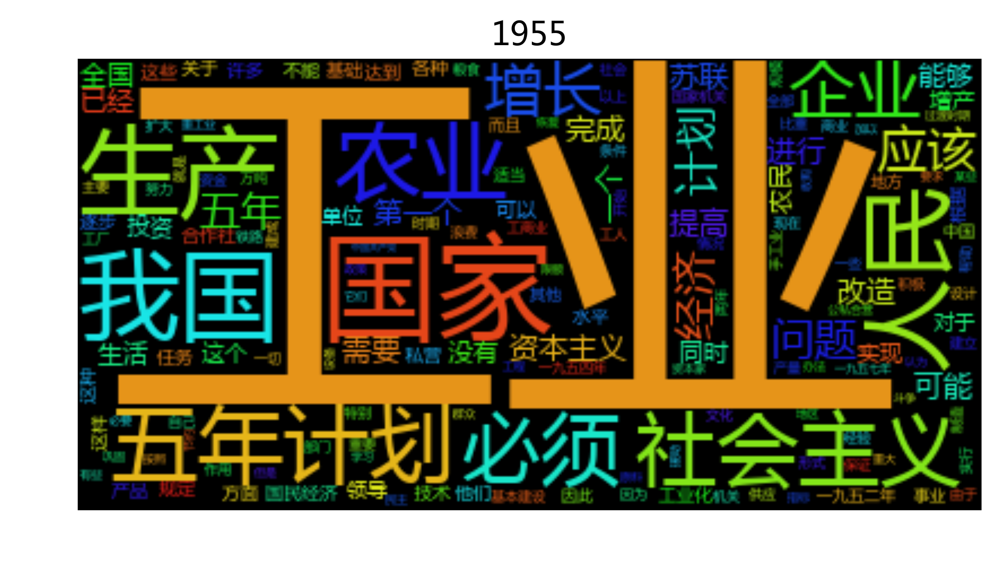

In [72]:
txt=reports[1]
seg_list=jieba.cut(txt,cut_all=False)
seg_list=[i for i in seg_list if i not in stopwords]
txt=r' '.join(seg_list)
wordcloudplot(txt,txt[:4])

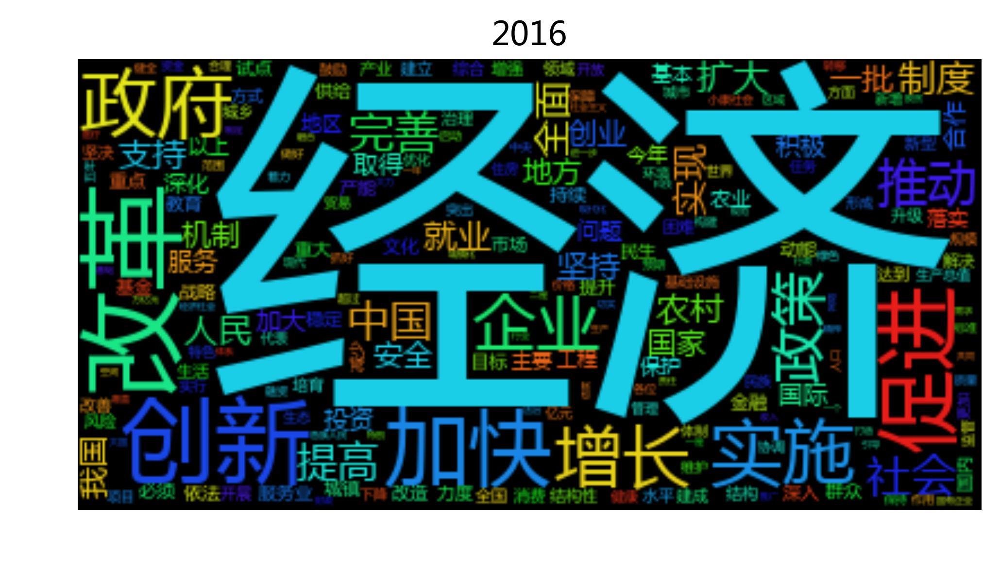

In [73]:
txt=reports[-1]
seg_list=jieba.cut(txt,cut_all=False)
seg_list=[i for i in seg_list if i not in stopwords]
txt=r' '.join(seg_list)
wordcloudplot(txt,txt[:4])

#  1954-2016政府工作报告词云

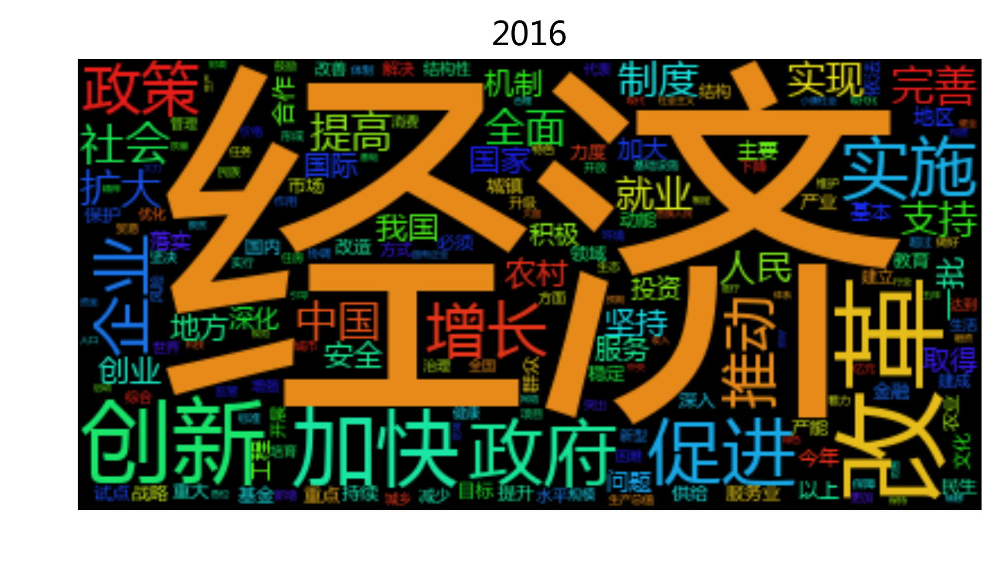

In [74]:
for txt in reports:
    seq_list=jieba.cut(txt,cut_all=False)
    seg_list=[i for i in seg_list if i not in stopwords]
    txt= r' '.join(seg_list)
    wordcloudplot(txt,txt[:4])
    file_path = '/Users/apricot/documents/GitHub/cjc2016/figure/wordcloud-' + txt[:4] + '.png'
    plt.savefig(file_path,dpi = 400, bbox_inches="tight",transparent = True)

# 词向量的时间序列

In [75]:
import jieba.analyse

wordset=[]
for txt in reports:
    top30=jieba.analyse.textrank(txt, topK=200,withWeight=False)
    for w in top30:
        if w not in wordset:
            wordset.append(w)

In [76]:
len(wordset)

1293

In [78]:
print ','.join(wordset)

国家,人民,工业,发展,建设,工作,生产,美国,企业,经济,计划,社会主义,中国,进行,全国,技术,亚洲,集团,需要,问题,农业,方面,完成,建立,台湾,生活,事业,没有,改造,应当,资本主义,增加,关系,组织,保证,会议,侵略,不能,注意,加强,战争,提高,社会,文化,继续,政府,现代化,能够,日内瓦,世界,东南亚,运动,起来,参加,苏联,少数民族,协议,管理,浪费,实行,群众,机关,采取,解决,得到,制度,现象,条约,改善,领导,资金,革命,集体,职工,任务,政策,地方,增长,斗争,商业,工作人员,合作,情况,农民,规定,恢复,日本,卖国,法律,比重,解放,物质,实现,劳动,原则,改进,力量,城市,工程,时期,破坏,企图,朝鲜,研究,印度支那,总产值,帮助,地区,扩大,重工业,保障,合理,教育,产品,财政,作用,依靠,才能,民主,成为,巩固,华侨,中央,任意,培养,收购,制造厂,要求,分子,供应,权利,代表,粮食,包括,棉花,基础,推广,使用,表现,节约,国际,水平,损失,公私合营,行政,全部,宪法,防务,忽视,防洪,人才,不够,产量,思想,容许,国民经济,还有,等于,准备,加以,时候,希望,干涉,大家,商品,民族,经验,大陆,适应,胜利,不顾,领土,五年计划,克服,中华人民共和国,设备,工业化,决定,达到,活动,国营商业,势力,缺点,加紧,有关,联系,支持,已有,满足,指导,开展,发挥,市场,独立,铁路,昌都地区,保卫,部门,正义,知识分子,应该,可能,投资,增产,单位,设计,工人,条件,制造,形式,建成,原料,手工业,工厂,开始,办法,资本家,规模,新建,农村,例如,过渡时期,认为,工业生产,干部,大量,职员,施工,减少,学习,土地,帝国主义,利用,援助,数量,限额,人员,指标,厂矿,加工,汽车,种类,速度,工人阶级,原有,学校,质量,科学技术,方针,政治,轻工业,错误,措施,定货,合作化,改变,经营,统治,接受,周转量,试制,改建,材料,个体,道路,工业品,面积,积极性,薯类,产值,重点,实际,建筑,促进,水利,所有制,消费品,总任务,历史,掌握,非生产性,标准,比例,预算,支出,收入,部分,执行,国营,立井,公路,项目,税收,总数,片面,数字,价格,钢材,扣除,国营企业,预计,收支,状况,兰州,拨付,货物,水库,工业部,降低,可比,过程,储备,包头,决算

In [79]:
from collections import defaultdict

data = defaultdict(dict)
years = [int(i[:4]) for i in reports]
for i in wordset:
    for year in years:
        data[i][year] = 0 

In [80]:
for txt in reports:
    year = int(txt[:4])
    top1000= jieba.analyse.textrank(txt, topK=1000, withWeight=True)
    for ww in top1000:
        word, weight = ww
        if word in wordset:
            data[word][year]+= weight

In [81]:
word_weight = []
for i in data:
    word_weight.append([i, np.sum(data[i].values())])

In [82]:
word_weight.sort(key= lambda x:x[1], reverse = True )
top50 = [i[0] for i in word_weight[:50]]

In [83]:
print ' '.join(top50) 

发展 建设 经济 加强 企业 工作 改革 国家 人民 继续 社会主义 提高 社会 生产 农业 政府 制度 增加 推进 问题 促进 增长 方面 农村 管理 加快 进行 重点 坚持 全国 教育 投资 市场 工业 地区 完善 计划 支持 实行 政策 生活 中国 文化 扩大 实现 基本 改善 建立 技术 群众


In [84]:
def plotEvolution(word, color, linestyle, marker):
    cx = data[word]
    plt.plot(cx.keys(), cx.values(), color = color, 
             linestyle=linestyle, marker=marker, label= word)
    plt.legend(loc=2,fontsize=8)
    plt.ylabel(u'词语重要性')

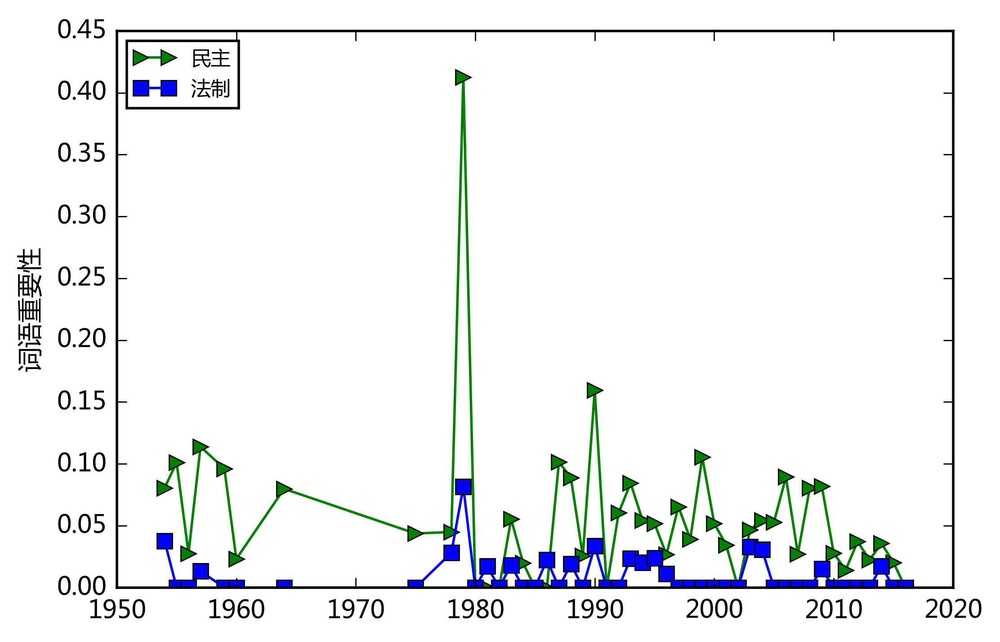

In [85]:
plotEvolution(u'民主', 'g', '-', '>')
plotEvolution(u'法制', 'b', '-', 's')

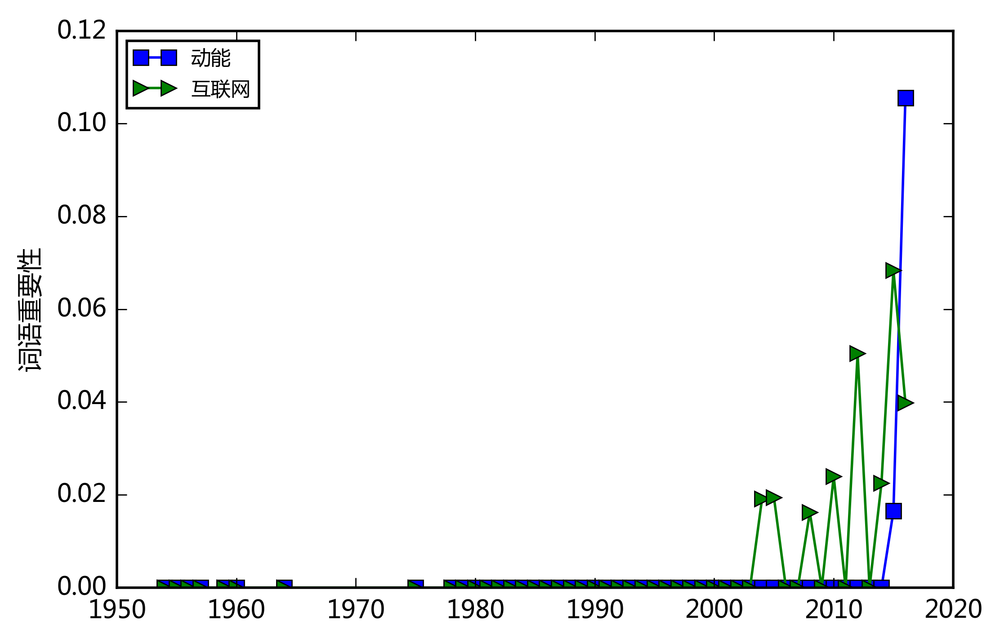

In [86]:
plotEvolution(u'动能', 'b', '-', 's')
plotEvolution(u'互联网', 'g', '-', '>')

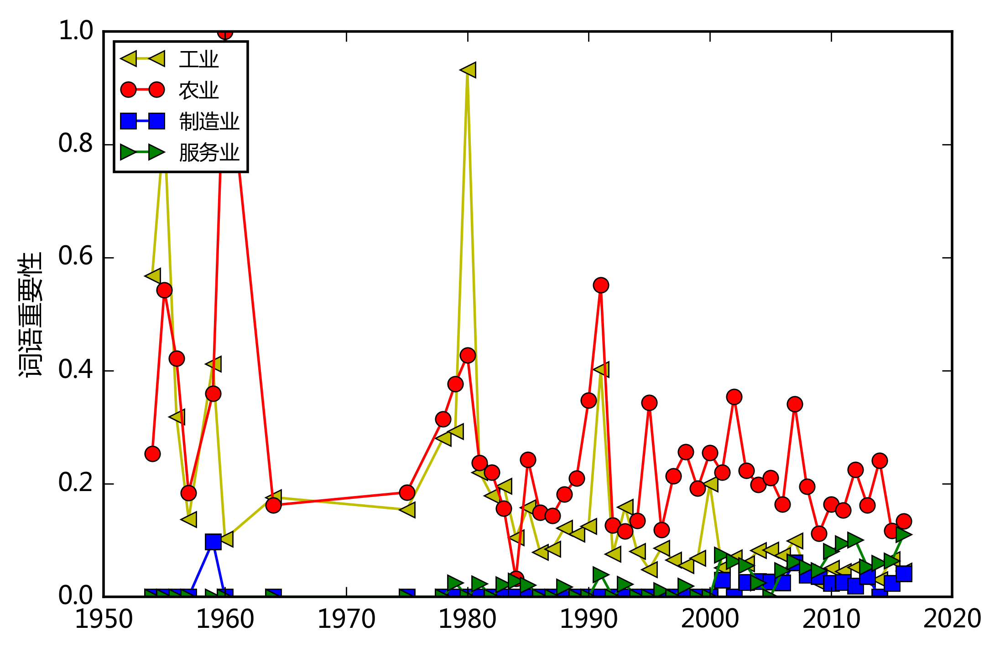

In [87]:
plotEvolution(u'工业', 'y', '-', '<')
plotEvolution(u'农业', 'r', '-', 'o')
plotEvolution(u'制造业', 'b', '-', 's')
plotEvolution(u'服务业', 'g', '-', '>')


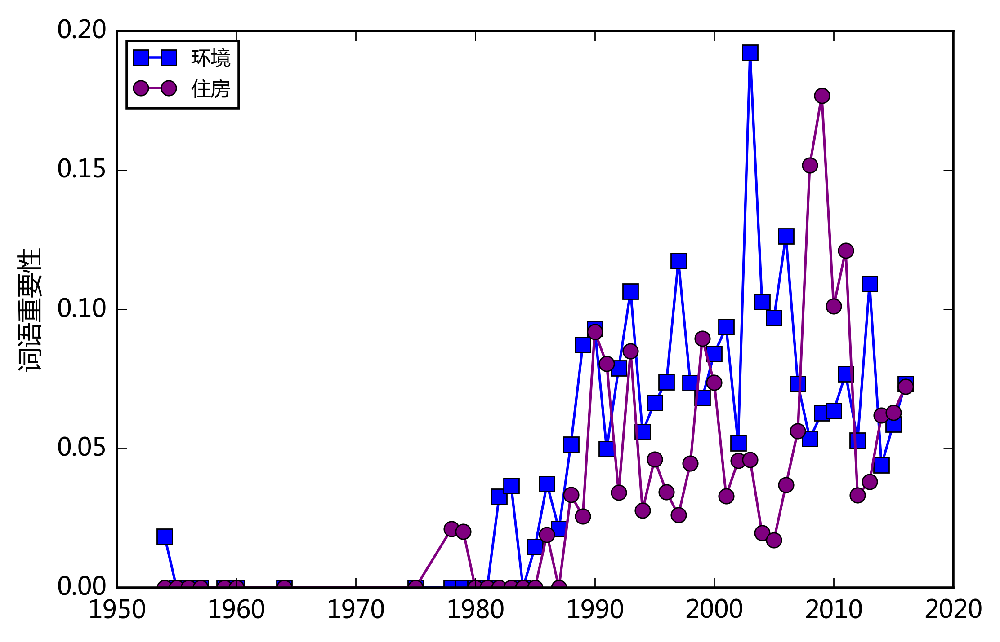

In [88]:
plotEvolution(u'环境', 'b', '-', 's')
plotEvolution(u'住房', 'purple', '-', 'o')

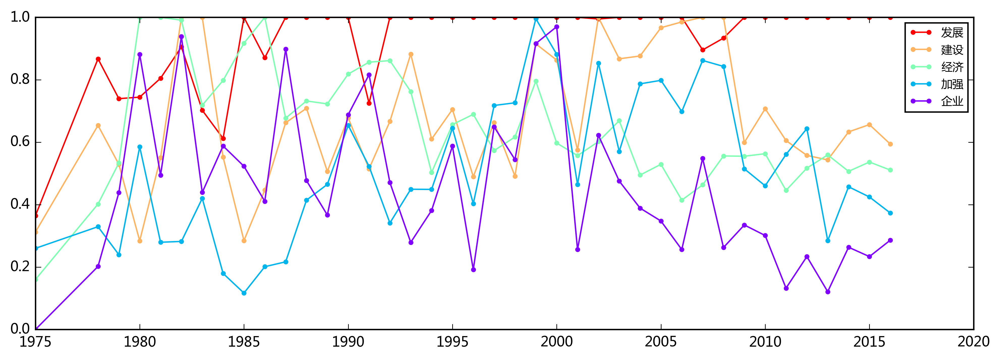

In [89]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in enumerate(top50[:5]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

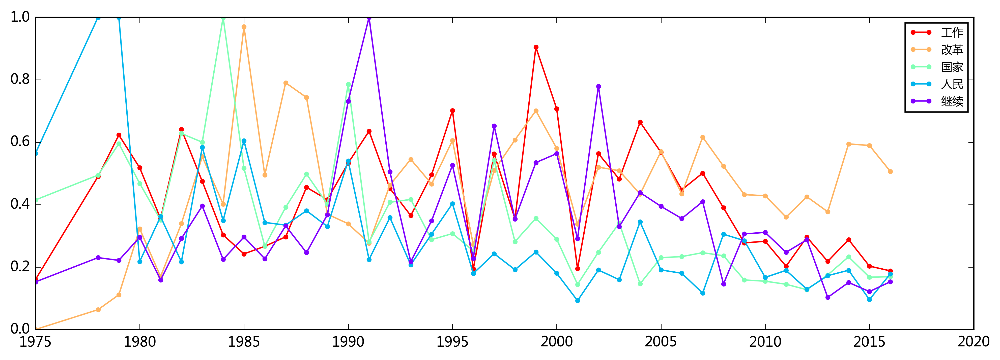

In [92]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in enumerate(top50[5:10]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

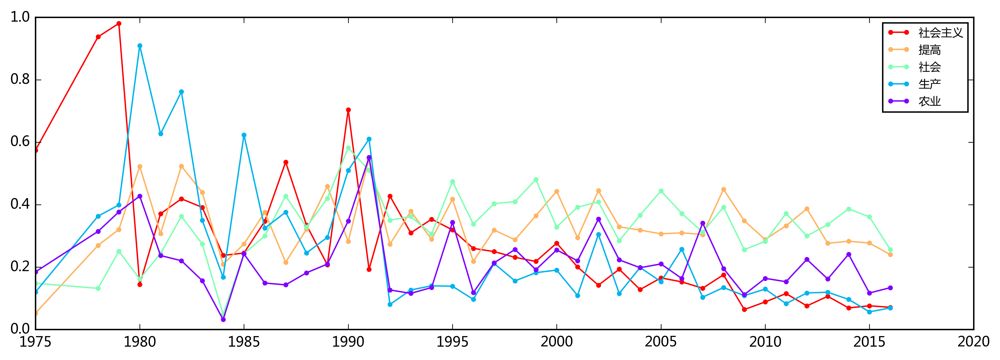

In [93]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[10:15]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

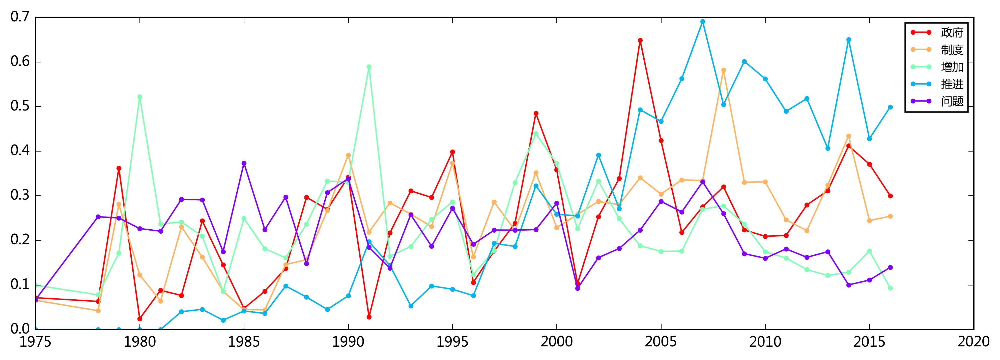

In [94]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[15:20]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

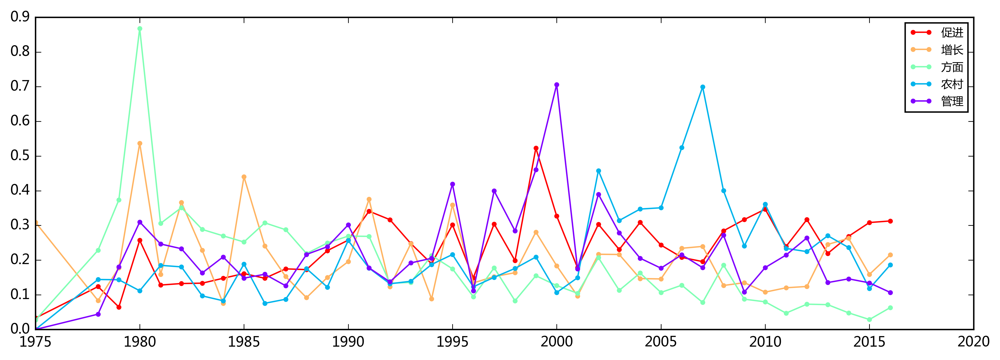

In [95]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[20:25]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

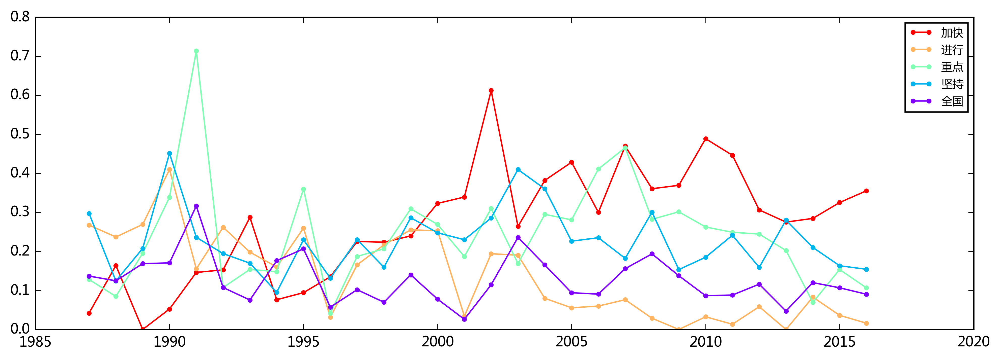

In [96]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[25:30]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

# kmeans 聚类

In [97]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
dataX = []
wordX = []
for word in top50:
    dataX.append(data[word].values()[-40:])
    wordX.append(word)
dataX = np.array(dataX)

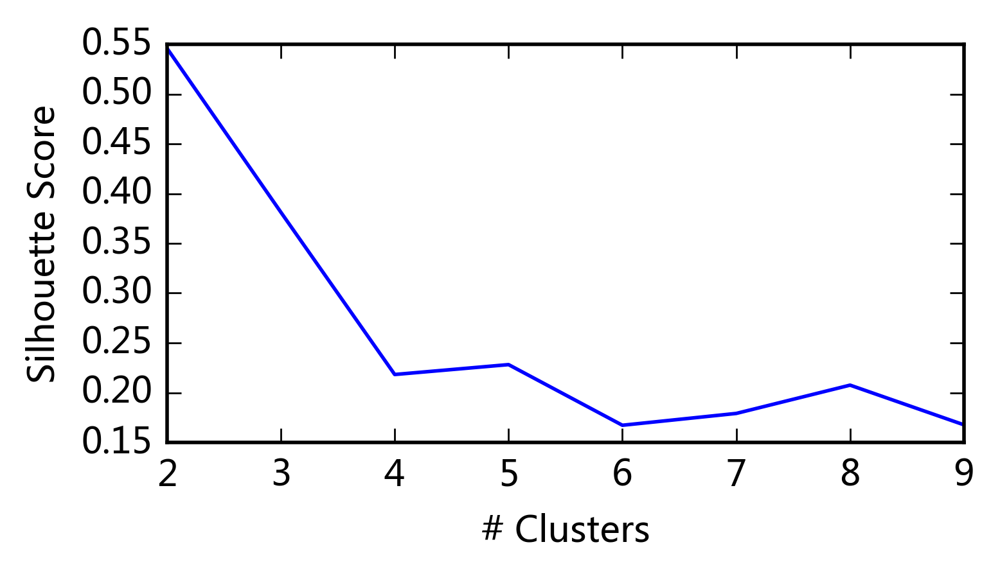

In [98]:
import numpy as np
from sklearn.cluster import KMeans
silhouette_score = [] 
for cluster_num in range(2, 10):
    kmeans_model = KMeans(n_clusters=cluster_num, random_state=1).fit(dataX)
    labels = kmeans_model.labels_
    sscore = metrics.silhouette_score(dataX, labels, metric='euclidean')
    silhouette_score.append(sscore)

fig = plt.figure(figsize=(4, 2),facecolor='white')    
plt.plot(range(2, 10), silhouette_score)
plt.xlabel('# Clusters')
plt.ylabel('Silhouette Score')
plt.show() # 聚成不同类，2-10，对应的不同的得分；纵轴得分范围：－1 到＋1；＋1效果最好

In [99]:
kmeans_model = KMeans(n_clusters=2, random_state=1).fit(dataX)
labels = kmeans_model.labels_
labels

array([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1], dtype=int32)

In [100]:
print ' '.join(wordX)

发展 建设 经济 加强 企业 工作 改革 国家 人民 继续 社会主义 提高 社会 生产 农业 政府 制度 增加 推进 问题 促进 增长 方面 农村 管理 加快 进行 重点 坚持 全国 教育 投资 市场 工业 地区 完善 计划 支持 实行 政策 生活 中国 文化 扩大 实现 基本 改善 建立 技术 群众


In [101]:
print '\t'.join([wordX[index] for index in np.where(labels==0)[0]])

发展	建设	经济	加强	企业	工作	改革


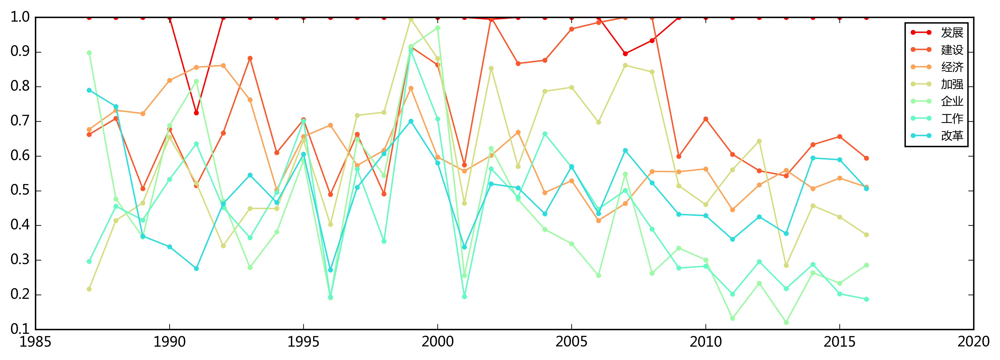

In [102]:
word_cluster1 = [wordX[index] for index in np.where(labels==0)[0]]

fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',10)

for k, word in  enumerate(word_cluster1[:10]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

In [103]:
print '\t'.join([wordX[index] for index in np.where(labels==1)[0]])

国家	人民	继续	社会主义	提高	社会	生产	农业	政府	制度	增加	推进	问题	促进	增长	方面	农村	管理	加快	进行	重点	坚持	全国	教育	投资	市场	工业	地区	完善	计划	支持	实行	政策	生活	中国	文化	扩大	实现	基本	改善	建立	技术	群众


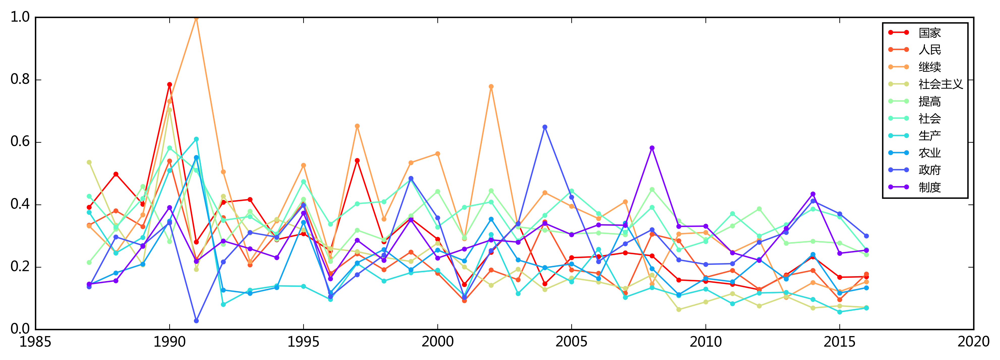

In [104]:
word_cluster2 = [wordX[index] for index in np.where(labels==1)[0]]

fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',10)

for k, word in  enumerate(word_cluster2[:10]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()